In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

In [2]:
img = cv2.imread('../DATA/00-puppy.jpg')

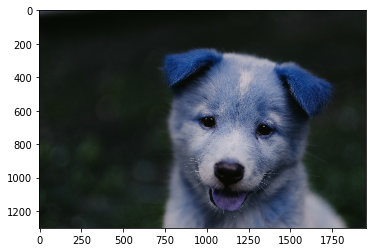

In [3]:
plt.imshow(img)

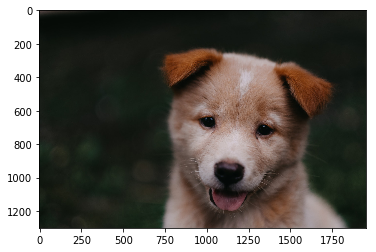

In [4]:
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB) 
plt.imshow(img)

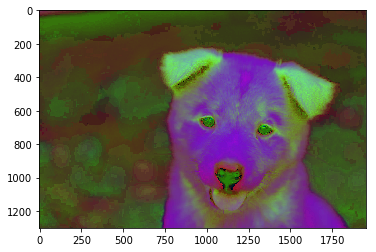

In [5]:
img = cv2.cvtColor(img,cv2.COLOR_BGR2HSV) #hue saturation value convertion
plt.imshow(img)

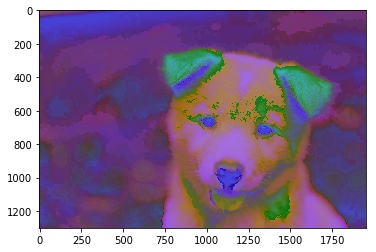

In [6]:
img = cv2.cvtColor(img,cv2.COLOR_BGR2HLS) #hue saturation light convertion
plt.imshow(img)

# BLending IMAGE

In [7]:
img1 = cv2.imread('../DATA/dog_backpack.png')
img2 = cv2.imread('../DATA/watermark_no_copy.png')
img1 = cv2.cvtColor(img1,cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(img2,cv2.COLOR_BGR2RGB)

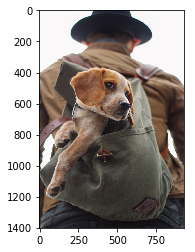

In [8]:
plt.imshow(img1)

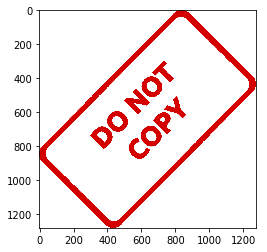

In [9]:
plt.imshow(img2)

In [10]:
img1.shape

(1401, 934, 3)

In [11]:
img2.shape

(1280, 1277, 3)

# BLENDING IMAGES OF SAME SIZE

In [12]:
img1 = cv2.resize(img1,(1200,1200))
img2 = cv2.resize(img2,(1200,1200))

In [13]:
blended_same_size = cv2.addWeighted(src1 = img1,alpha = 0.5,src2 = img2,beta = 0.5,gamma = 0)

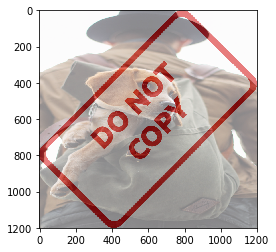

In [14]:
plt.imshow(blended_same_size)

# OVERLAY SMALL IMAGE ON TOP OF A LARGER IMAGE (NO BLENDING)
# NUMPY REASSIGNMENT

In [15]:
img1 = cv2.imread('../DATA/dog_backpack.png')
img2 = cv2.imread('../DATA/watermark_no_copy.png')
img1 = cv2.cvtColor(img1,cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(img2,cv2.COLOR_BGR2RGB)

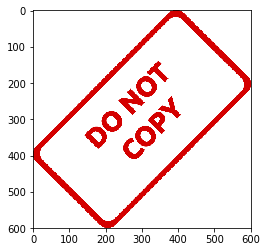

In [16]:
img2 = cv2.resize(img2,(600,600))
plt.imshow(img2)

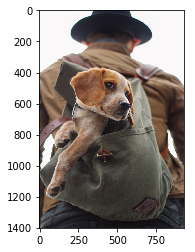

In [17]:
plt.imshow(img1)

In [18]:
large_img = img1
small_img = img2

In [19]:
x_pointer = 0
y_pointer = 0

In [20]:
x_end = x_pointer + small_img.shape[1]
y_end = y_pointer + small_img.shape[0]

In [21]:
large_img[y_pointer:y_end,x_pointer:x_end] = small_img

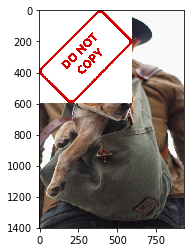

In [22]:
plt.imshow(large_img)

# BLENDING IMAGES OF DIFFERENT SIZES

In [23]:
img1 = cv2.imread('../DATA/dog_backpack.png')
img2 = cv2.imread('../DATA/watermark_no_copy.png')
img1 = cv2.cvtColor(img1,cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(img2,cv2.COLOR_BGR2RGB)

In [24]:
img2 = cv2.resize(img2,(600,600))

## CREATING REGION OF INTEREST (ROI)

In [25]:
img1.shape

(1401, 934, 3)

In [26]:
x_offset = img1.shape[1] - img2.shape[1]
y_offset = img1.shape[0] - img2.shape[0] 

In [27]:
rows,cols,channels = img2.shape

In [28]:
rows

600

In [29]:
cols

600

In [30]:
roi = img1[y_offset:img1.shape[0],x_offset:img1.shape[1]]

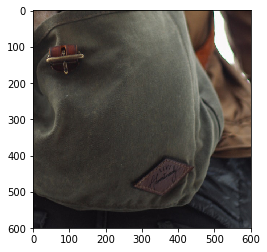

In [31]:
plt.imshow(roi)

In [32]:
img2gray = cv2.cvtColor(img2,cv2.COLOR_RGB2GRAY)

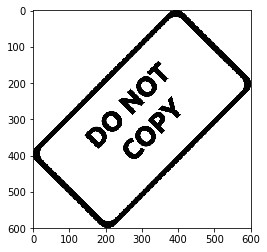

In [33]:
plt.imshow(img2gray,cmap = 'gray')

## CREATE MASK 

In [34]:
mask_inverse = cv2.bitwise_not(img2gray) #bitwise inverse the black portion to white as we're creating a mask

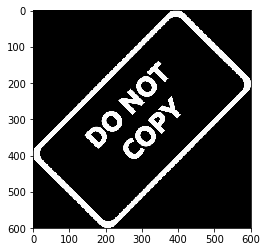

In [35]:
plt.imshow(mask_inverse,cmap = 'gray')

In [36]:
mask_inverse.shape

(600, 600)

In [37]:
white_background = np.full(img2.shape,255,dtype=np.uint8)

In [38]:
white_background.shape

(600, 600, 3)

In [39]:
bk = cv2.bitwise_or(white_background,white_background,mask = mask_inverse)

In [40]:
bk.shape

(600, 600, 3)

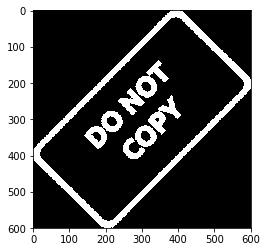

In [41]:
plt.imshow(bk)

In [42]:
fg = cv2.bitwise_or(img2,img2,mask = mask_inverse)

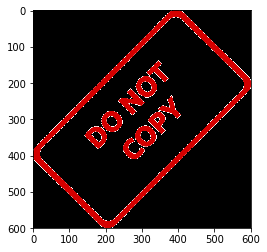

In [43]:
plt.imshow(fg)

In [44]:
final_roi = cv2.bitwise_or(roi,fg)

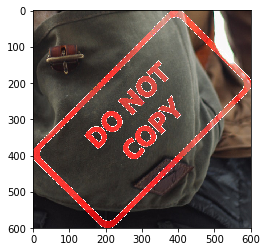

In [45]:
plt.imshow(final_roi)

In [46]:
large_img = img1
small_img = final_roi

In [47]:
large_img[y_offset:y_offset+small_img.shape[0],x_offset:x_offset+small_img.shape[1]] = small_img

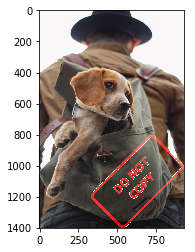

In [48]:
plt.imshow(large_img)

# IMAGE THRESHOLDING

In [49]:
img = cv2.imread('../DATA/rainbow.jpg')

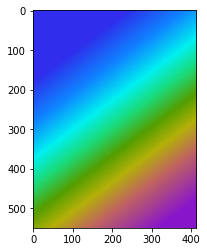

In [50]:
plt.imshow(img)

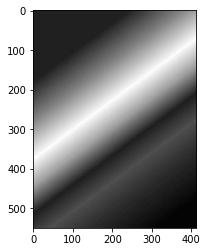

In [51]:
img = cv2.imread('../DATA/rainbow.jpg',0) #read in grayscale
plt.imshow(img, cmap = 'gray')

In [52]:
ret, thresh1 = cv2.threshold(img,127,255,cv2.THRESH_BINARY)

In [53]:
ret

127.0

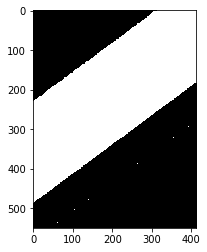

In [54]:
plt.imshow(thresh1,cmap = 'gray')

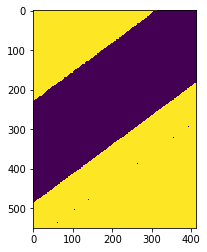

In [55]:
ret, thresh1 = cv2.threshold(img,127,255,cv2.THRESH_BINARY_INV)
plt.imshow(thresh1)

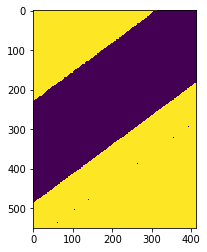

In [56]:
ret, thresh1 = cv2.threshold(img,127,255,cv2.THRESH_BINARY_INV)
plt.imshow(thresh1)

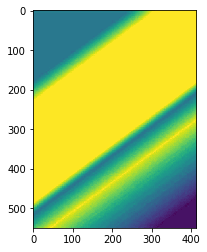

In [57]:
ret, thresh1 = cv2.threshold(img,127,255,cv2.THRESH_TRUNC)
plt.imshow(thresh1)

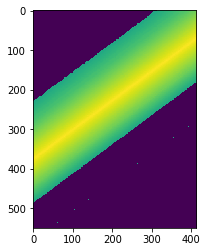

In [58]:
ret, thresh1 = cv2.threshold(img,127,255,cv2.THRESH_TOZERO)
plt.imshow(thresh1)

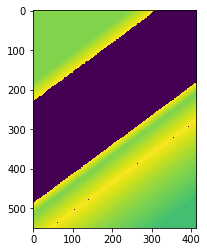

In [59]:
ret, thresh1 = cv2.threshold(img,127,255,cv2.THRESH_TOZERO_INV)
plt.imshow(thresh1)

In [60]:
img = cv2.imread('../DATA/crossword.jpg',0)

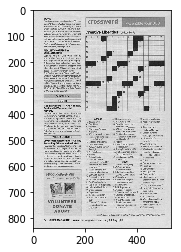

In [61]:
plt.imshow(img,cmap = 'gray')

In [62]:
def show_pic(img):
    fig = plt.figure(figsize=(15,15))
    ax = fig.add_subplot(111)
    ax.imshow(img,cmap = 'gray')

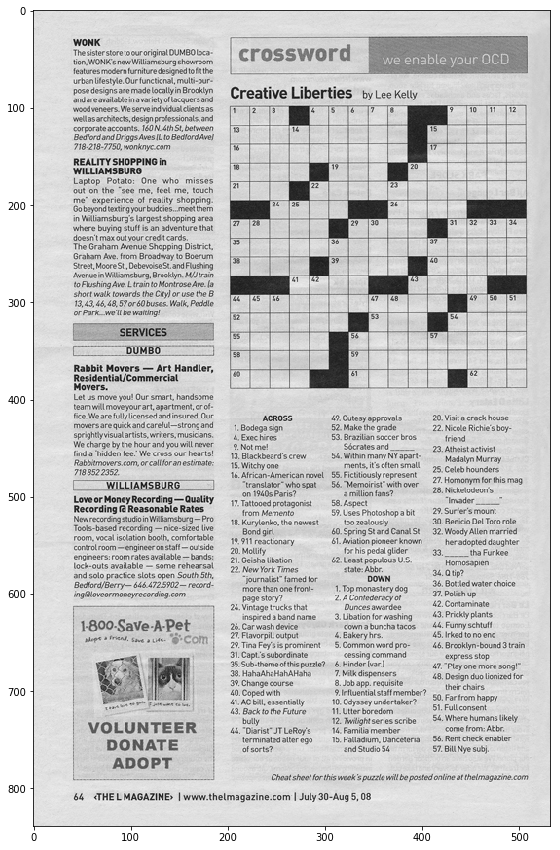

In [63]:
show_pic(img)

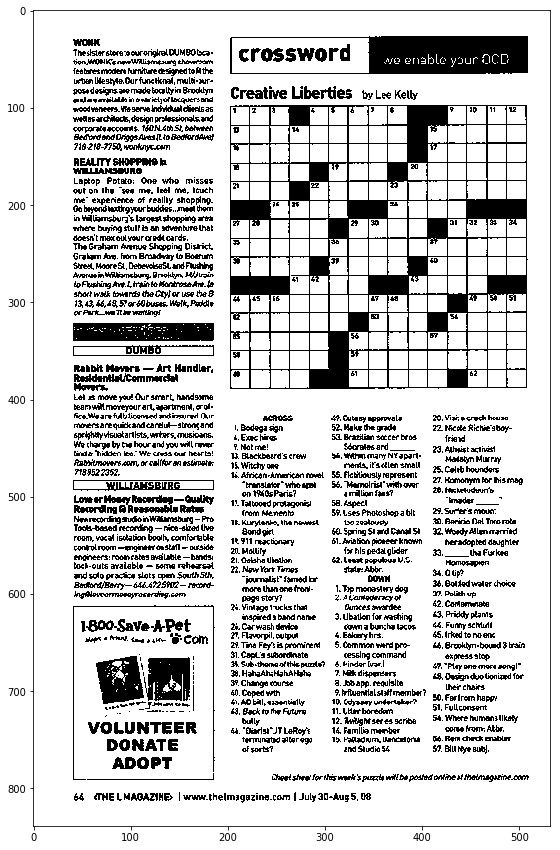

In [64]:
ret,th1 = cv2.threshold(img,180,255,cv2.THRESH_BINARY)
show_pic(th1)

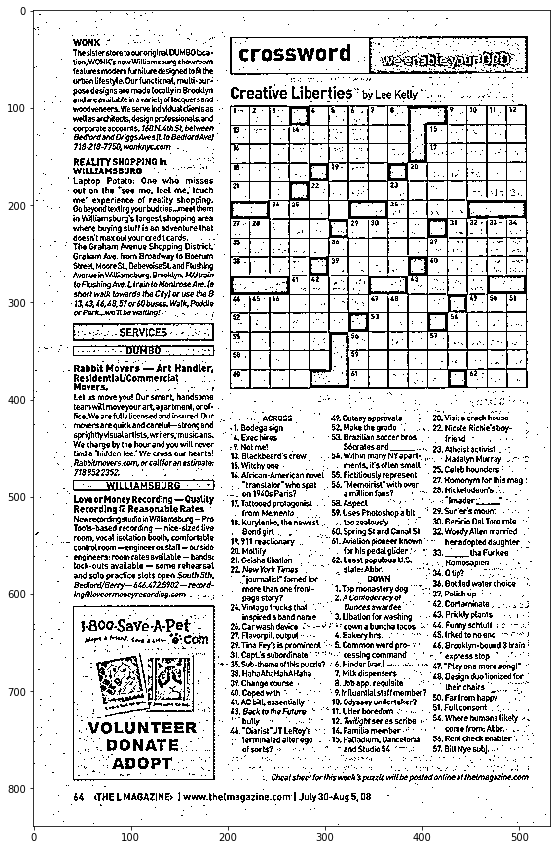

In [65]:
th2 = cv2.adaptiveThreshold(img,255,cv2.ADAPTIVE_THRESH_MEAN_C,cv2.THRESH_BINARY,7,8)
show_pic(th2)

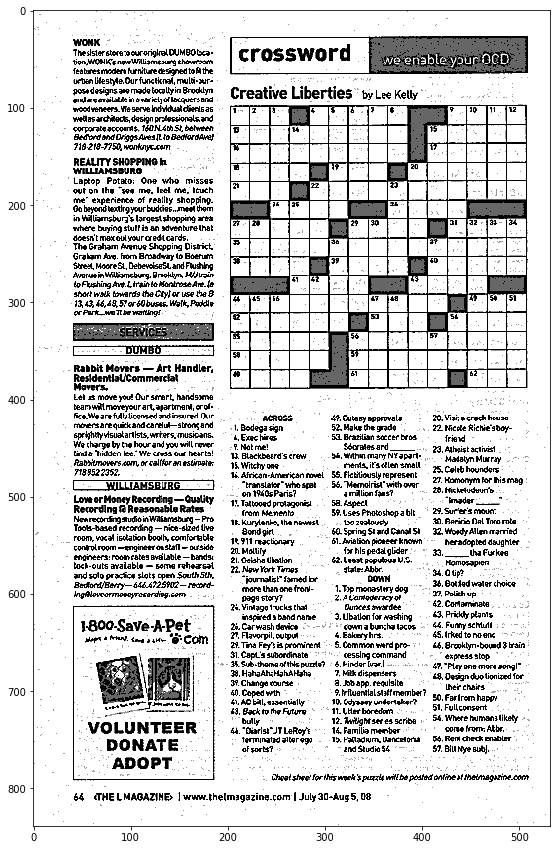

In [66]:
blended = cv2.addWeighted(src1 = th1, alpha = 0.6,src2 = th2,beta = 0.4, gamma = 0)
show_pic(blended)

# BLURRING IMAGES

In [67]:
def load_img():
    img = cv2.imread('../DATA/bricks.jpg').astype(np.float32) / 255
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    return img

In [68]:
# load_img()

In [69]:
def display_img(img):
    fig = plt.figure(figsize=(12,10))
    ax = fig.add_subplot(111)
    ax.imshow(img,cmap = 'gray')

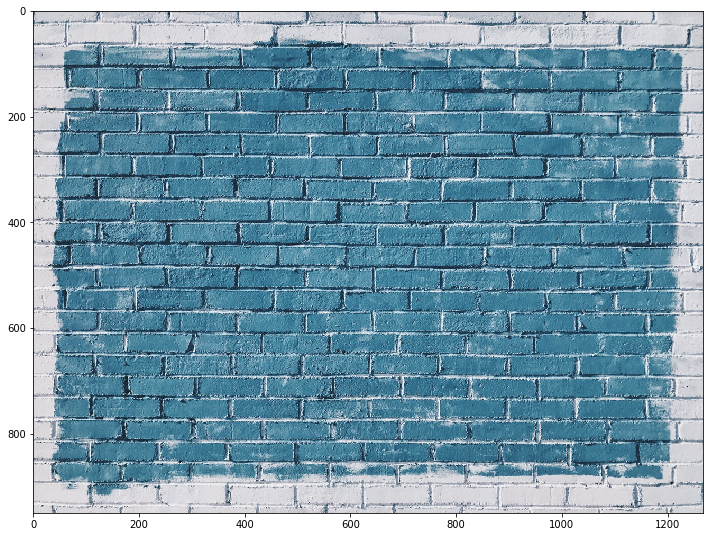

In [70]:
i = load_img()
display_img(i)

# GAMMA CORRECTION

In [71]:
gamma = 1/4 #gamma <1 image appear brighter >1 appear darker

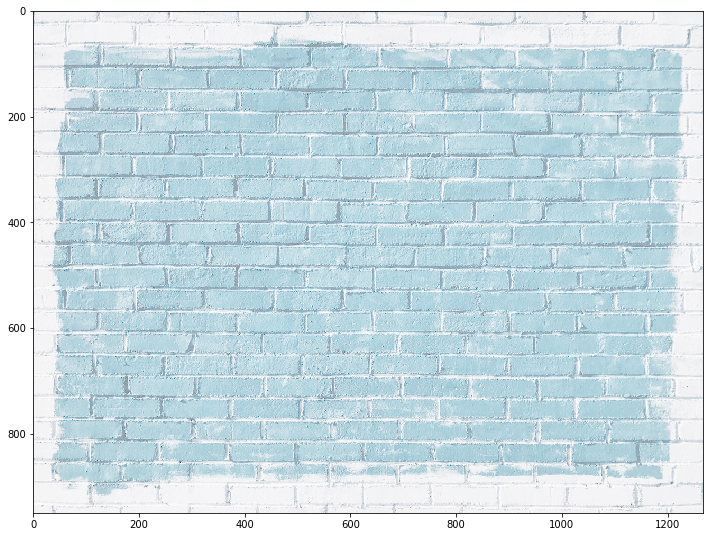

In [72]:
result = np.power(i,gamma)
display_img(result)

In [73]:
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img,text = 'bricks',org = (10,600),fontFace = font,fontScale = 10,color = (255,0,0),thickness=4)

array([[[0.7921569 , 0.78431374, 0.8039216 ],
        [0.7529412 , 0.77254903, 0.7882353 ],
        [0.7176471 , 0.76862746, 0.8       ],
        ...,
        [0.7764706 , 0.76862746, 0.7882353 ],
        [0.7764706 , 0.76862746, 0.7882353 ],
        [0.7764706 , 0.76862746, 0.7882353 ]],

       [[0.88235295, 0.8784314 , 0.8980392 ],
        [0.75686276, 0.78431374, 0.80784315],
        [0.69803923, 0.75686276, 0.78431374],
        ...,
        [0.7764706 , 0.76862746, 0.7882353 ],
        [0.7764706 , 0.76862746, 0.7882353 ],
        [0.7764706 , 0.76862746, 0.7882353 ]],

       [[0.8627451 , 0.8666667 , 0.8862745 ],
        [0.64705884, 0.68235296, 0.70980394],
        [0.48235294, 0.5372549 , 0.57254905],
        ...,
        [0.7764706 , 0.76862746, 0.7882353 ],
        [0.7764706 , 0.76862746, 0.7882353 ],
        [0.7764706 , 0.76862746, 0.7882353 ]],

       ...,

       [[0.8509804 , 0.83137256, 0.84705883],
        [0.84705883, 0.827451  , 0.84313726],
        [0.84313726, 0

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


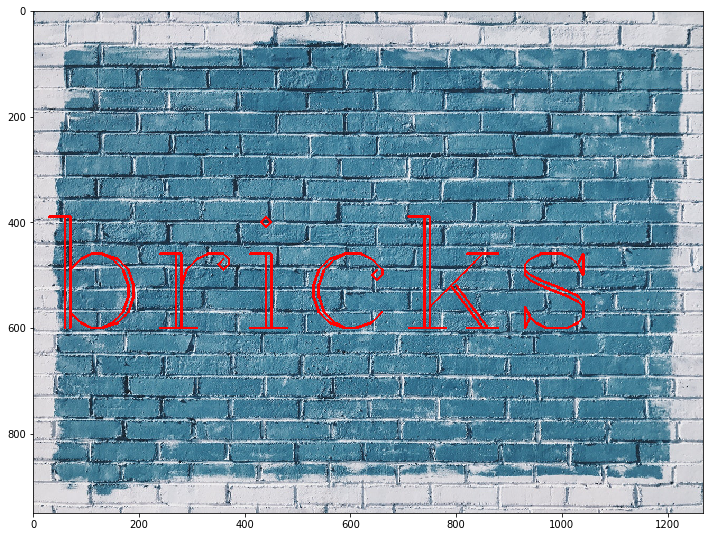

In [74]:
display_img(img)

In [75]:
kernel = np.ones(shape=(5,5),dtype = np.float32)/25

In [76]:
kernel

array([[0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04]], dtype=float32)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


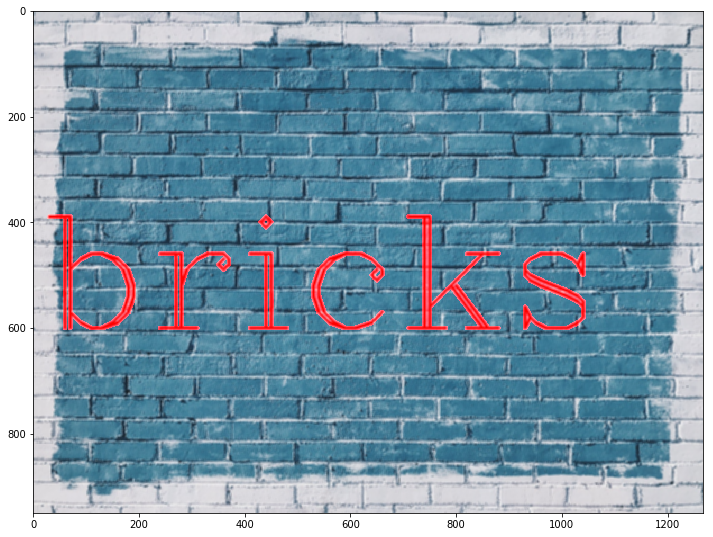

In [77]:
dst = cv2.filter2D(img,-1,kernel) #-1 means the output depth ==  input depth
display_img(dst)

In [78]:
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img,text = 'bricks',org = (10,600),fontFace = font,fontScale = 10,color = (255,0,0),thickness=4)
print('reset')

reset


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


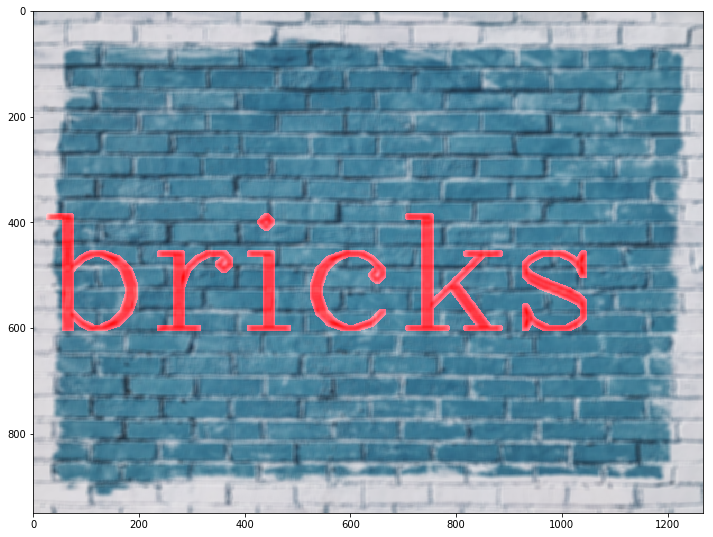

In [79]:
blurred = cv2.blur(img,ksize=(10,9))
display_img(blurred)

In [80]:
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img,text = 'bricks',org = (10,600),fontFace = font,fontScale = 10,color = (255,0,0),thickness=4)
print('reset')

reset


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


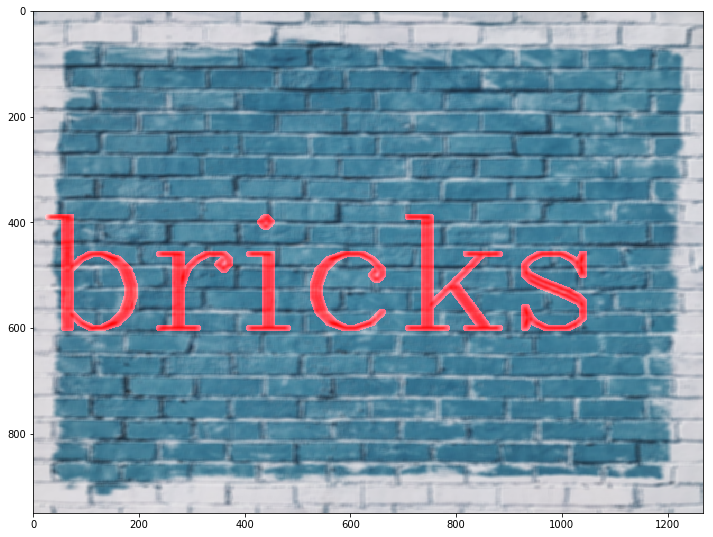

In [81]:
blurred_img = cv2.GaussianBlur(img,(11,7),10)
display_img(blurred_img)

In [82]:
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img,text = 'bricks',org = (10,600),fontFace = font,fontScale = 10,color = (255,0,0),thickness=4)
print('reset')

reset


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


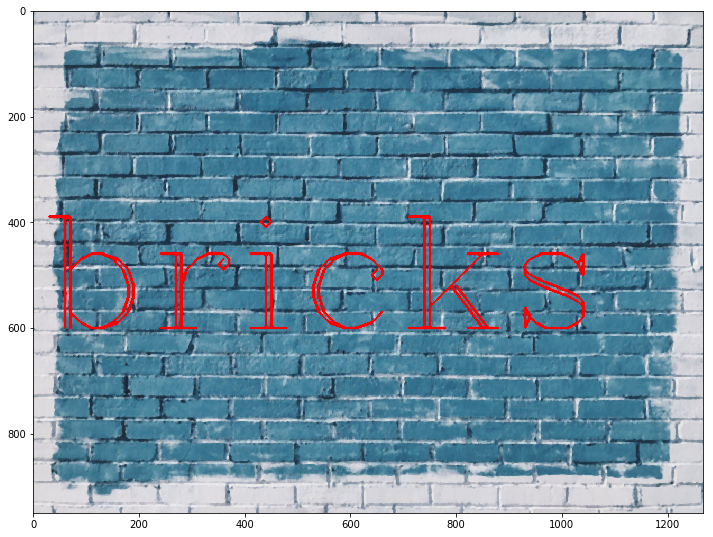

In [83]:
median_blur = cv2.medianBlur(img,5) #good for reducing noise
display_img(median_blur)

In [84]:
img = cv2.imread('../DATA/sammy.jpg')
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)

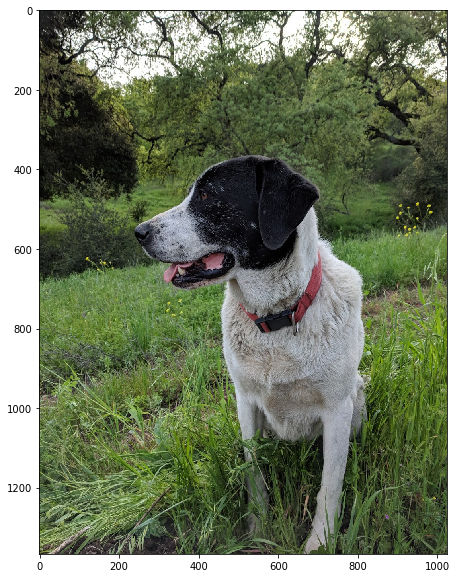

In [85]:
display_img(img)

In [86]:
noise_img = cv2.imread('../DATA/sammy_noise.jpg')

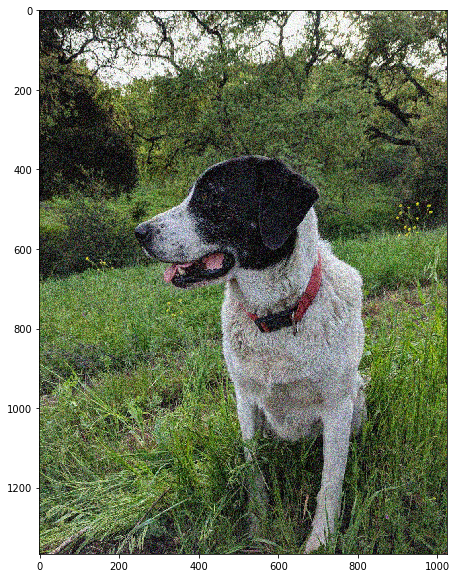

In [87]:
display_img(noise_img)

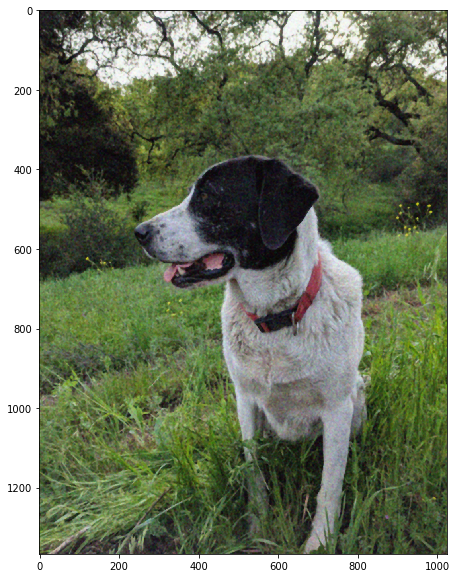

In [88]:
mediun = cv2.medianBlur(noise_img,5)
display_img(mediun)

In [89]:
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img,text = 'bricks',org = (10,600),fontFace = font,fontScale = 10,color = (255,0,0),thickness=4)
print('reset')

reset


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


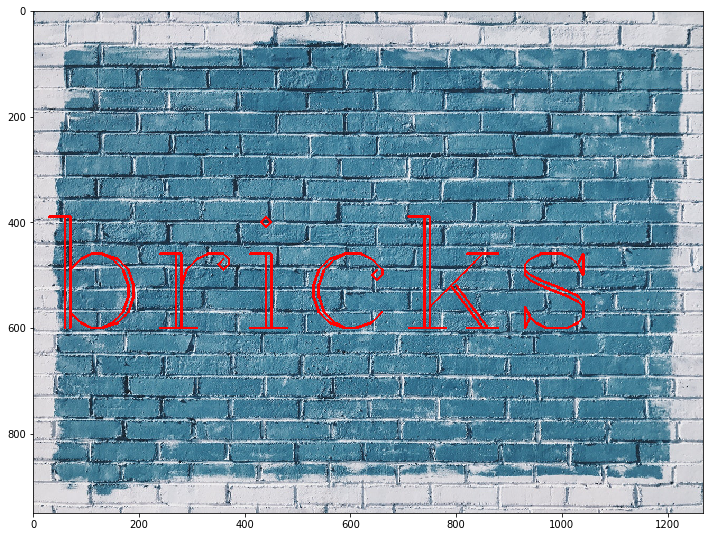

In [90]:
display_img(img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


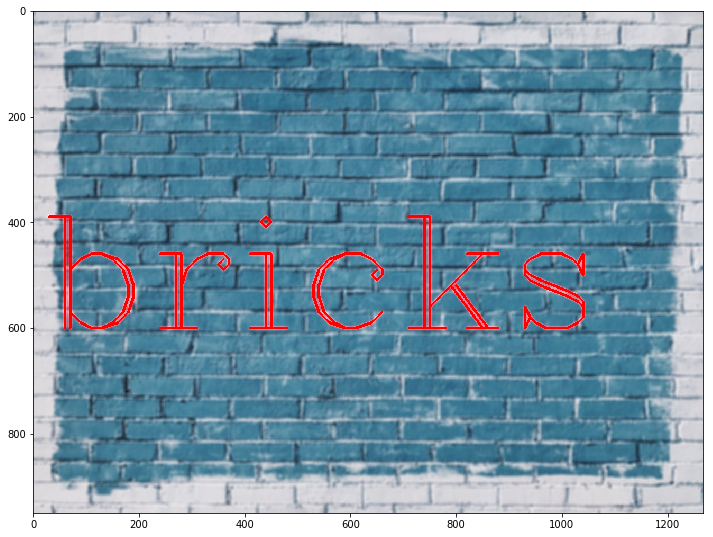

In [91]:
blur = cv2.bilateralFilter(img,9,75,75)
display_img(blur)

# MORPHOLOGICAL OPERATIONS

In [92]:
def load_blank_img():
    blank_img = np.zeros((600,600))
    font = cv2.FONT_HERSHEY_COMPLEX
    cv2.putText(blank_img,text = 'ABCDE',org = (50,300),fontFace = font,fontScale = 5,color = (255,255,255),thickness=25,lineType=cv2.LINE_AA)
    return blank_img

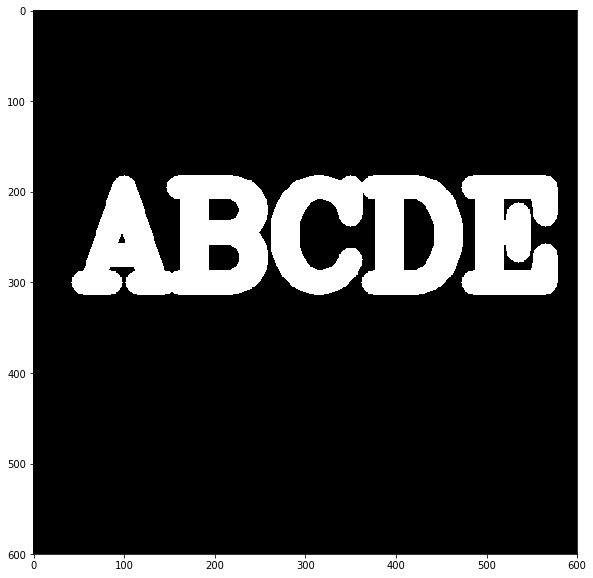

In [93]:
img = load_blank_img()
display_img(img)

## EROSION

In [94]:
kernel = np.ones((5,5),dtype=np.uint8)

In [95]:
kernel

array([[1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1]], dtype=uint8)

In [96]:
result = cv2.erode(img,kernel,iterations=4) #iteration larger means erode/shrink foreground more

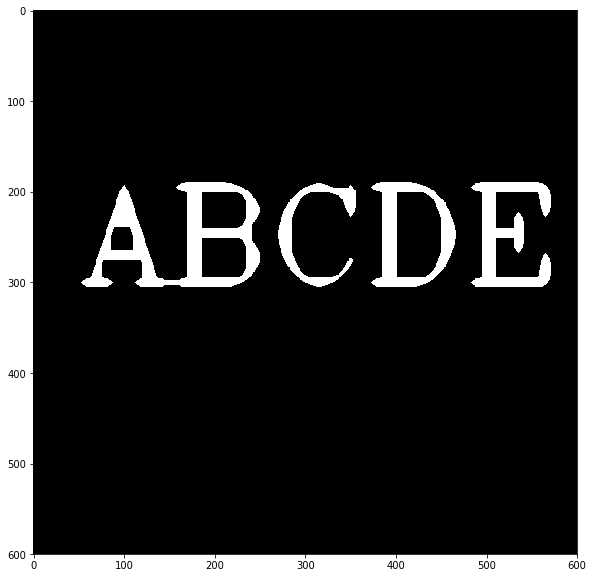

In [97]:
display_img(result)

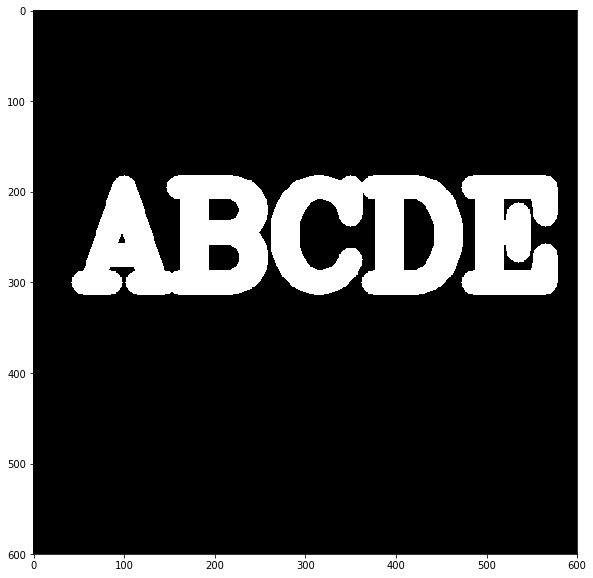

In [98]:
img = load_blank_img()
display_img(img)

In [99]:
white_noise = np.random.randint(low=0,high=2,size=(600,600))

In [100]:
white_noise

array([[0, 0, 1, ..., 1, 0, 1],
       [1, 0, 0, ..., 1, 1, 1],
       [1, 0, 0, ..., 1, 1, 0],
       ...,
       [0, 1, 1, ..., 0, 0, 1],
       [1, 0, 0, ..., 1, 0, 0],
       [1, 0, 0, ..., 0, 1, 0]])

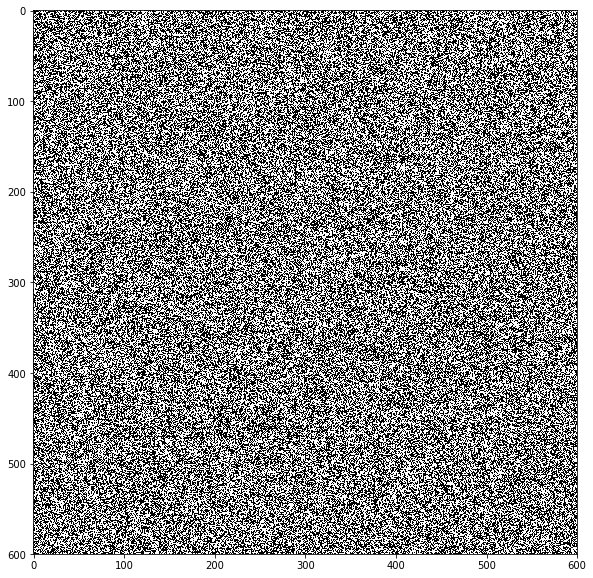

In [101]:
display_img(white_noise)

In [102]:
white_noise = white_noise * 255 #make it same scale as the img we want to add noise

In [103]:
noise_img = white_noise + img

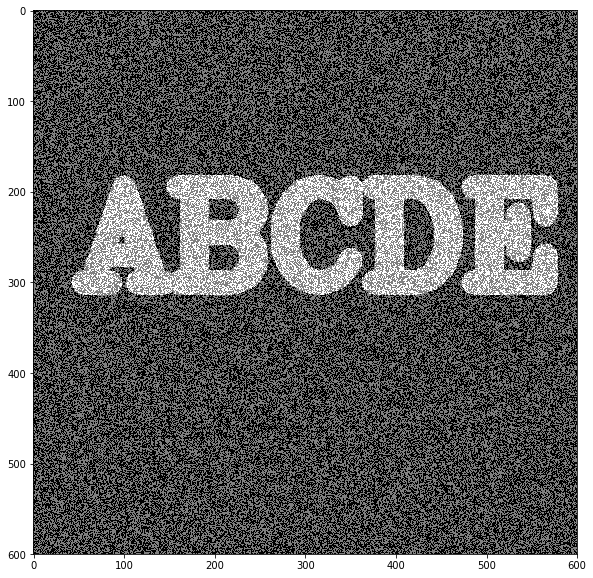

In [104]:
display_img(noise_img)

In [105]:
opening = cv2.morphologyEx(noise_img,cv2.MORPH_OPEN,kernel) #morph_open get rid of this noise erosion followed by dialation better to remove background noise

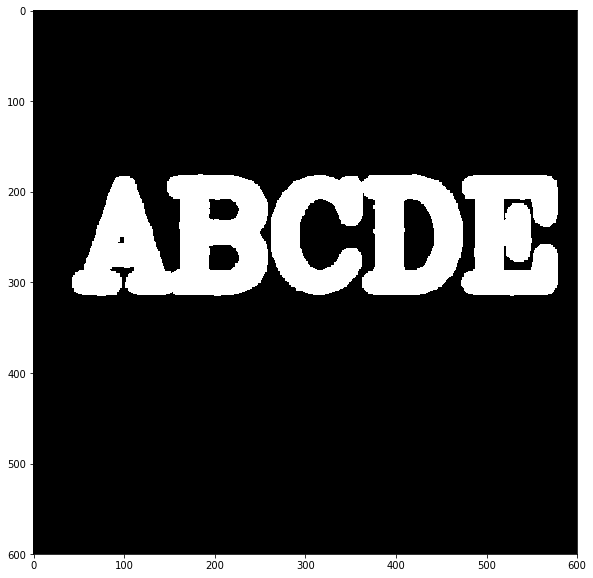

In [106]:
display_img(opening)

In [107]:
black_noise = np.random.randint(low=0,high=2,size=(600,600))

In [108]:
black_noise = black_noise * -255 #make some of the foreground to black

In [109]:
black_noise_img = img + black_noise
black_noise_img[black_noise_img== -255] = 0 #set the -255 value to 0 as our linear limit is from 0-255

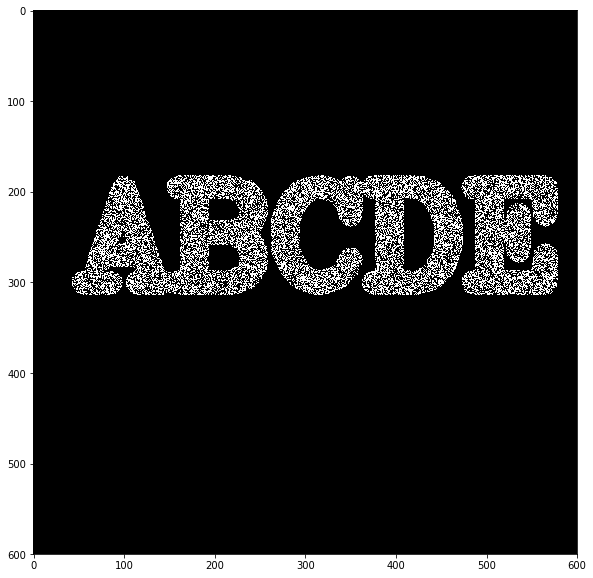

In [110]:
display_img(black_noise_img)

In [111]:
closing = cv2.morphologyEx(black_noise_img,cv2.MORPH_CLOSE,kernel)

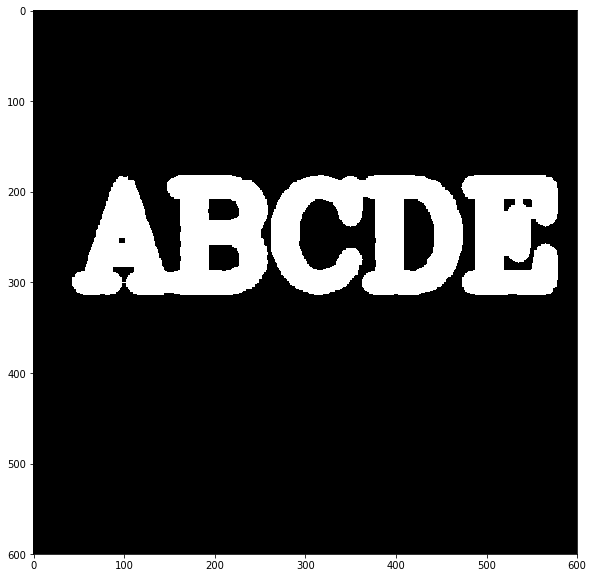

In [112]:
display_img(closing) #get rid of foreground noise, opposite of opening

In [113]:
img = load_blank_img()

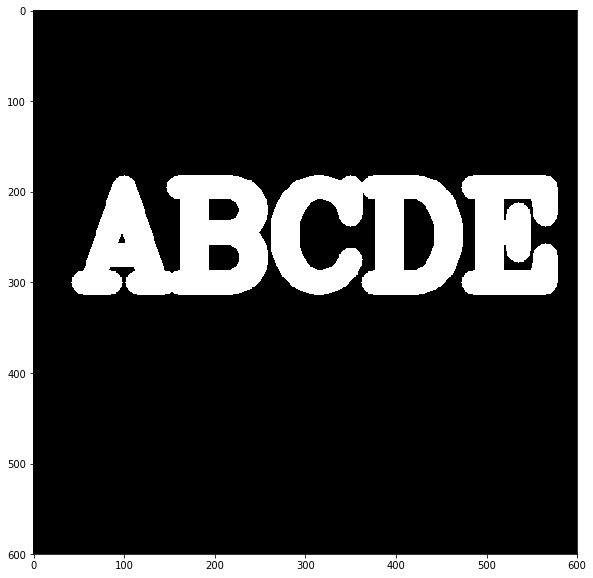

In [114]:
display_img(img)

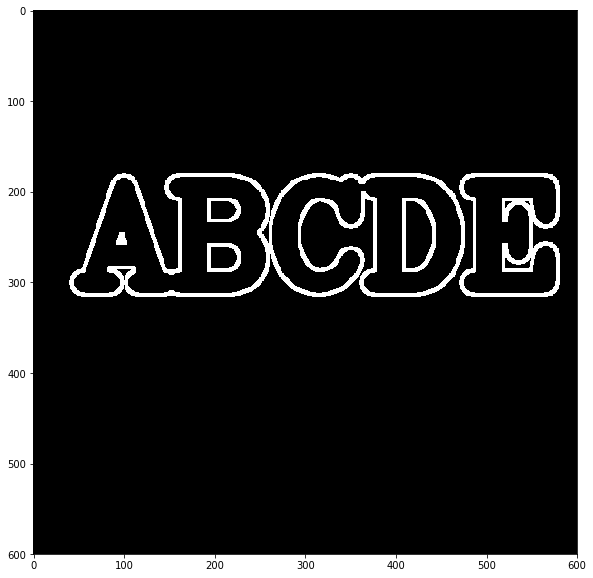

In [115]:
gradient = cv2.morphologyEx(img,cv2.MORPH_GRADIENT,kernel) #get only edges   diff betn erosion & dialation
display_img(gradient)

# BLENDING / GRADIENTS

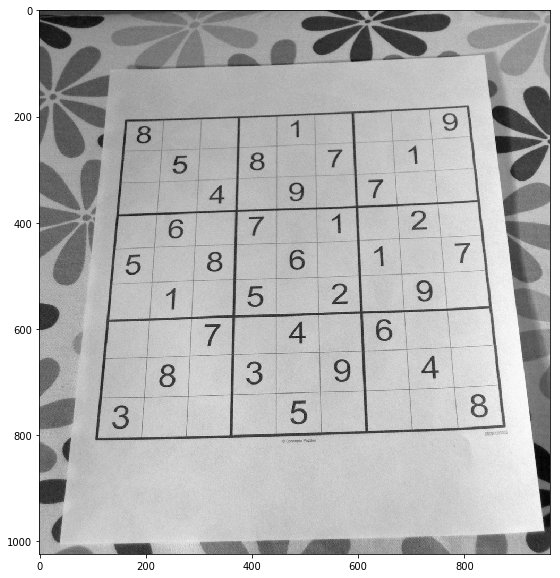

In [116]:
img = cv2.imread('../DATA/sudoku.jpg',0)
display_img(img)

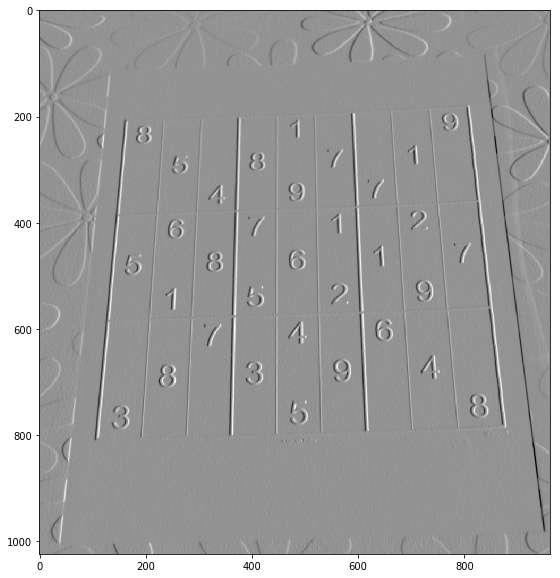

In [117]:
#calculate x gradient
sobelx = cv2.Sobel(img,cv2.CV_64F,1,0,ksize = 5)
display_img(sobelx)

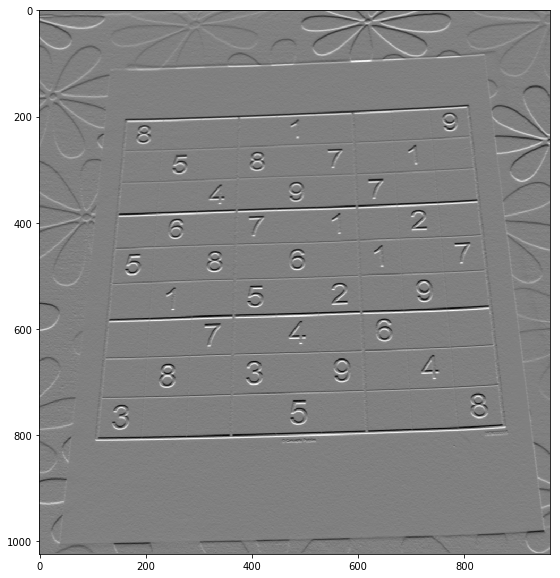

In [118]:
#sobel gradient y
sobely = cv2.Sobel(img,cv2.CV_64F,0,1,ksize = 5)
display_img(sobely)

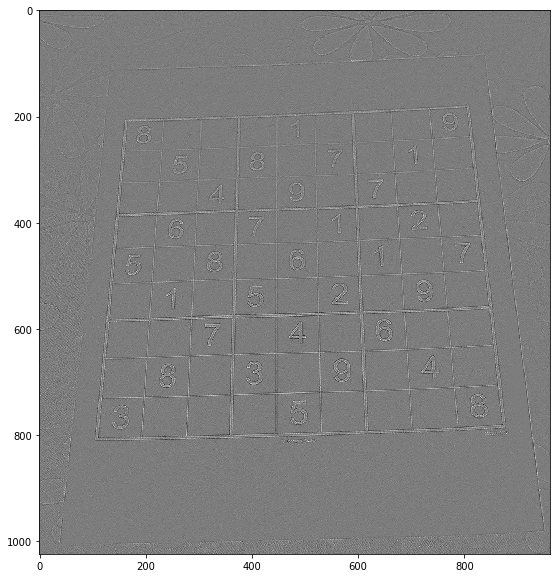

In [119]:
# laplacian operator
laplacian = cv2.Laplacian(img,cv2.CV_64F)
display_img(laplacian)

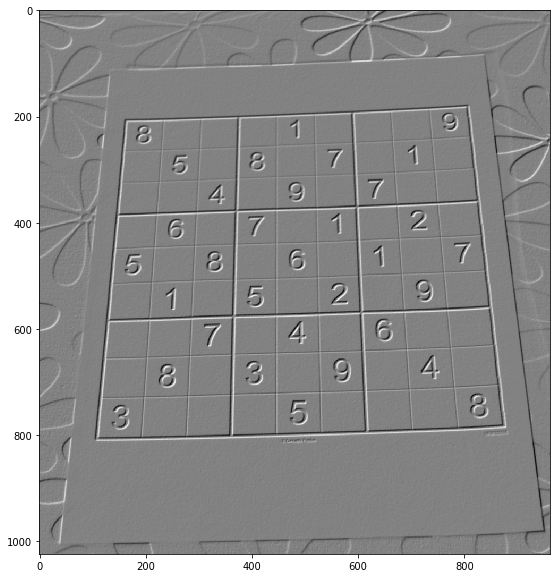

In [120]:
#combine sobelx and sobely
sobelBoth = cv2.addWeighted(src1 = sobelx,alpha = 0.5,src2 = sobely,beta = 0.5,gamma = 0)
display_img(sobelBoth)

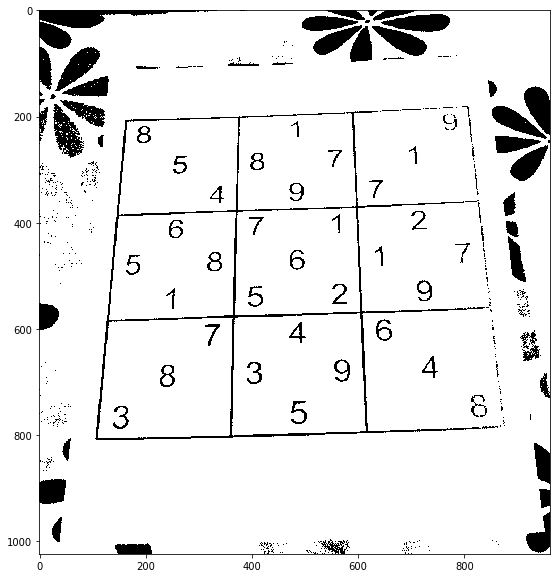

In [121]:
ret,th1 = cv2.threshold(img , 100,255,cv2.THRESH_BINARY)
display_img(th1)

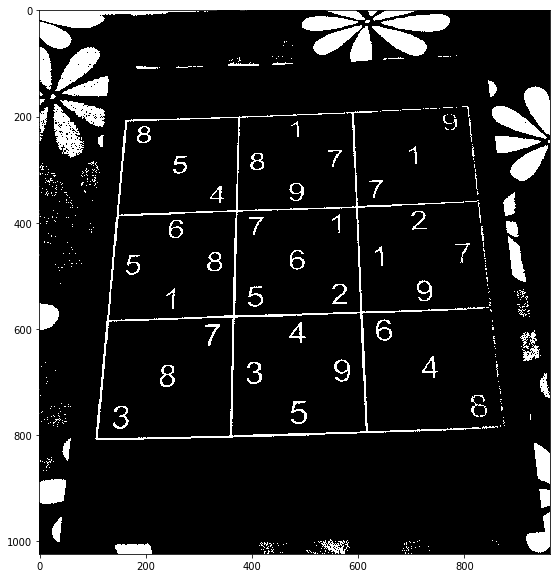

In [129]:
ret,th1 = cv2.threshold(img , 100,255,cv2.THRESH_BINARY_INV)
display_img(th1)

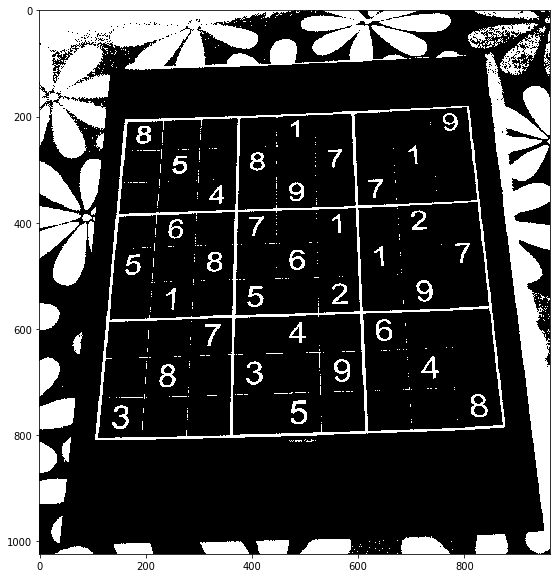

In [131]:
ret,th1 = cv2.threshold(img , 150,255,cv2.THRESH_BINARY_INV)
display_img(th1)

In [122]:
kernel = np.ones((4,4),np.uint8)

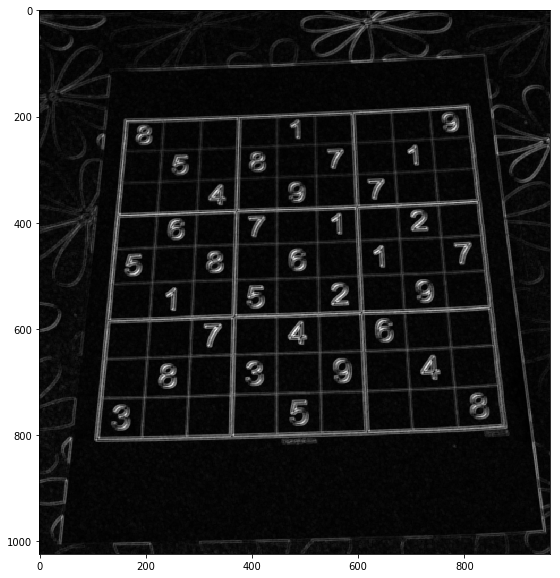

In [123]:
gradient = cv2.morphologyEx(sobelBoth,cv2.MORPH_GRADIENT,kernel)
display_img(gradient)

# HISTOGRAM

In [124]:
dark_horse = cv2.imread('../DATA/horse.jpg') #for calculations
show_horse = cv2.cvtColor(dark_horse,cv2.COLOR_BGR2RGB) #color corrected for matplotlib

rainbow = cv2.imread('../DATA/rainbow.jpg')
show_rainbow = cv2.cvtColor(rainbow,cv2.COLOR_BGR2RGB)

blue_bricks = cv2.imread('../DATA/bricks.jpg')
show_bricks = cv2.cvtColor(blue_bricks,cv2.COLOR_BGR2RGB)

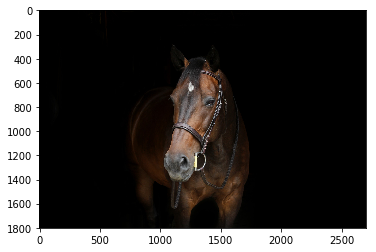

In [125]:
plt.imshow(show_horse)

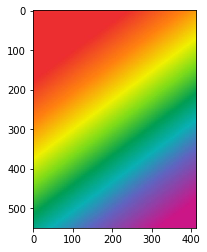

In [126]:
plt.imshow(show_rainbow)

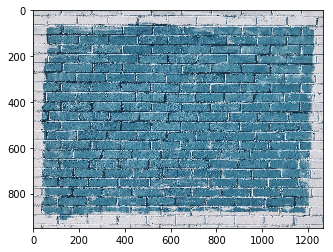

In [127]:
plt.imshow(show_bricks)

In [133]:
#calculate histogram
hist_values = cv2.calcHist([blue_bricks],channels=[0],mask=None,histSize = [256],ranges=[0,256]) #[img_src],
#colors=[BGR] mask->optional param, if you want mask one part of the image and calculate histogram only on that part, 
#histsize = upper limit,ranges [lower limit,upper limit]

In [134]:
hist_values.shape

(256, 1)

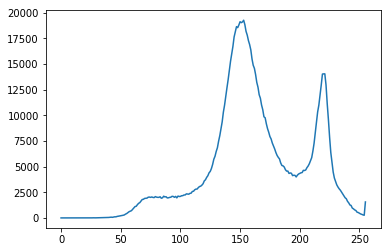

In [135]:
plt.plot(hist_values)

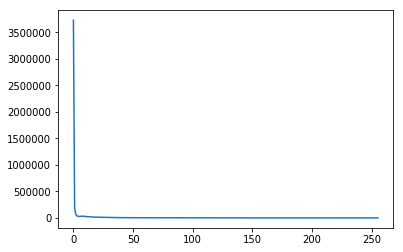

In [136]:
hist_values = cv2.calcHist([dark_horse],channels=[0],mask=None,histSize = [256],ranges=[0,256])
plt.plot(hist_values)

In [137]:
img = blue_bricks

Text(0.5,1,'HISTOGRAM FOR BLUE BRICKS')

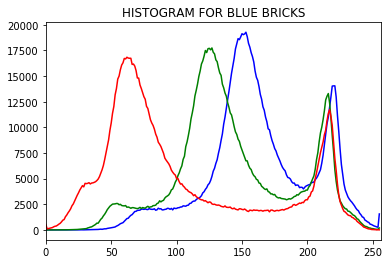

In [138]:
color = ['b','g','r']

for i, col in enumerate(color):
    histr = cv2.calcHist([img],[i],None,[256],[0,256])
    plt.plot(histr,color = col)
    plt.xlim([0,256])
    
plt.title('HISTOGRAM FOR BLUE BRICKS')

In [139]:
img = rainbow

In [140]:
img.shape

(550, 413, 3)

In [141]:
img.shape[:2]

(550, 413)

In [142]:
mask = np.zeros(img.shape[:2],np.uint8)

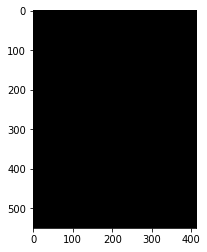

In [144]:
plt.imshow(mask,cmap = 'gray')
mask[300:400,100:400] = 255

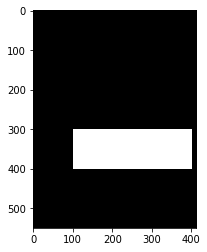

In [145]:
plt.imshow(mask,cmap = 'gray')

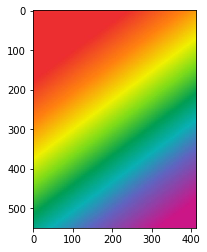

In [146]:
plt.imshow(show_rainbow)

In [147]:
masked_img = cv2.bitwise_and(img,img,mask=mask)

In [148]:
show_masked_img = cv2.bitwise_and(show_rainbow,show_rainbow,mask=mask) #for visuLIZATION

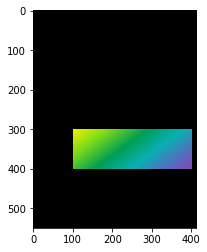

In [149]:
plt.imshow(show_masked_img)

In [150]:
hist_mask_values_red = cv2.calcHist([rainbow],channels=[2],mask = mask,histSize = [256],ranges=[0,256])

In [153]:
hist_values_red = cv2.calcHist([rainbow],channels=[2],mask = None,histSize = [256],ranges=[0,256])

Text(0.5,1,'Red Histogram For MAsked Rainbow')

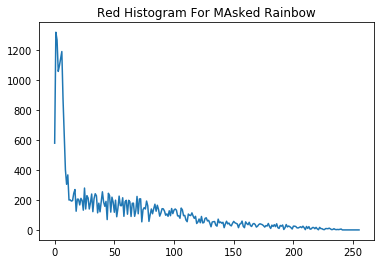

In [152]:
plt.plot(hist_mask_values_red)
plt.title('Red Histogram For MAsked Rainbow')

Text(0.5,1,'Red Histogram For NO MAsked Rainbow')

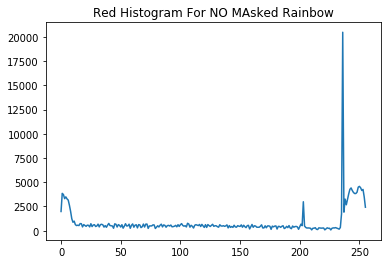

In [154]:
plt.plot(hist_mask_values)
plt.title('Red Histogram For NO MAsked Rainbow')

## HISTOGRAM EQUALIZATION

In [155]:
gorilla = cv2.imread('../DATA/gorilla.jpg',0)

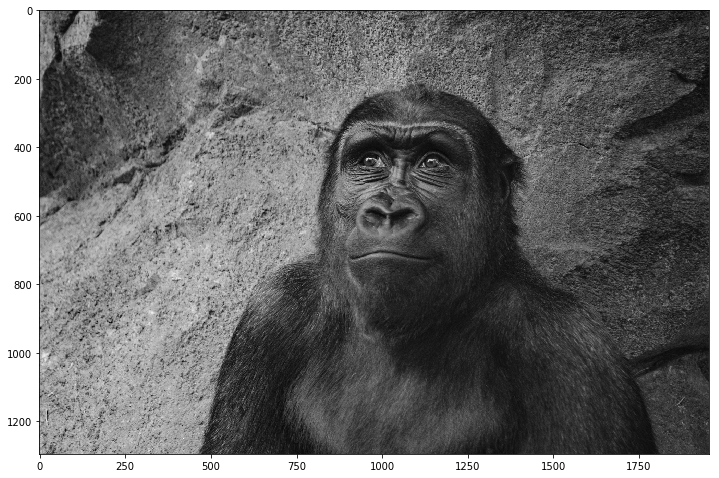

In [158]:
display_img(gorilla)

In [159]:
gorilla.shape

(1295, 1955)

In [161]:
hist_values = cv2.calcHist([gorilla],channels=[0],mask=None,histSize = [256],ranges = [0,256])

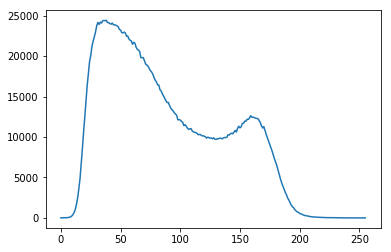

In [162]:
plt.plot(hist_values)

In [163]:
eq_gorilla = cv2.equalizeHist(gorilla)

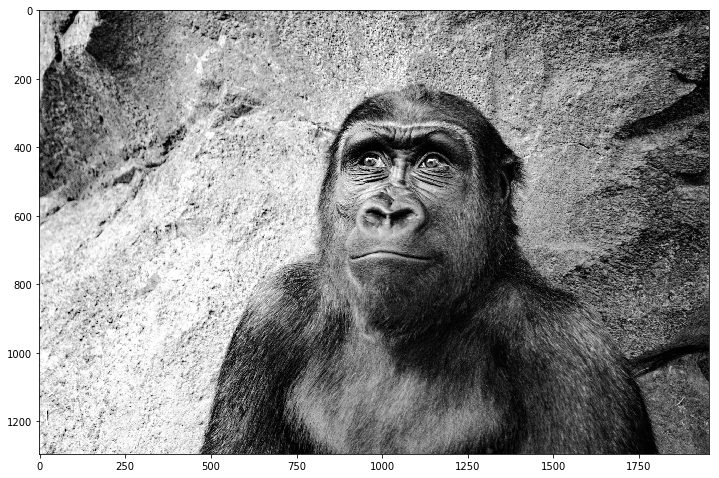

In [164]:
display_img(eq_gorilla)

In [165]:
hist_values = cv2.calcHist([eq_gorilla],channels=[0],mask=None,histSize = [256],ranges = [0,256])

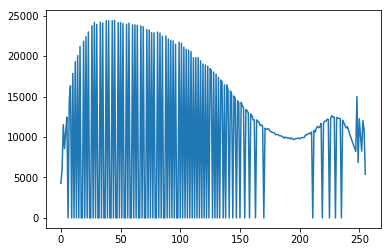

In [166]:
plt.plot(hist_values)

In [167]:
color_gorilla = cv2.imread('../DATA/gorilla.jpg')

In [168]:
show_gorilla = cv2.cvtColor(color_gorilla,cv2.COLOR_BGR2RGB)

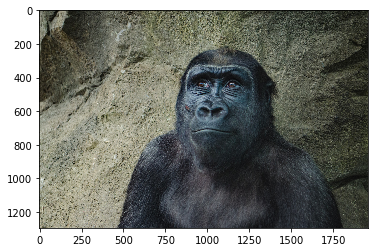

In [169]:
plt.imshow(show_gorilla)

In [170]:
hsv= cv2.cvtColor(color_gorilla,cv2.COLOR_BGR2HSV)

In [171]:
hsv[:,:,2] = cv2.equalizeHist(hsv[:,:,2])

In [172]:
eq_color_gorilla = cv2.cvtColor(hsv,cv2.COLOR_HSV2RGB)

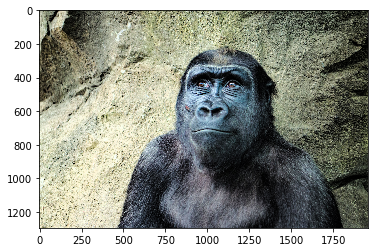

In [173]:
plt.imshow(eq_color_gorilla)